# Simulation | [0,-27] Synchrotron

In [1]:
import joblib
import timeit

def savedata( name, obj ):
    tic=timeit.default_timer()
    with open( name,'wb' ) as Gv:
        joblib.dump( obj, Gv)
    toc=timeit.default_timer()
    print(toc - tic)
    
def loaddata( name ):
    tic=timeit.default_timer()
    with open( name,'rb' ) as Gv:
        mydata = joblib.load( Gv)
    toc=timeit.default_timer()
    print(toc - tic)
    return mydata

def load_Gfree_fitmap():
    Gfree_FoV2_fitmap = loaddata('Gfree_FoV2_fitmap.db')
    Gfree_FoV4_fitmap = loaddata('Gfree_FoV4_fitmap.db')
    return Gfree_FoV4_fitmap, Gfree_FoV2_fitmap
    
def load_Gsync_fitmap():
    Gsync_FoV2_fitmap = loaddata('Gsync_FoV2_fitmap.db')
    Gsync_FoV4_fitmap = loaddata('Gsync_FoV4_fitmap.db')
    return Gsync_FoV4_fitmap, Gsync_FoV2_fitmap

def load_Gfree_simmap():
    Fov4patch_map = loaddata('Gfree_FoV4_simmap.db')
    Fov4patch_gss = loaddata('Gfree_FoV4_simgss.db')
    Fov2patch_map = loaddata('Gfree_FoV2_simmap.db')
    Fov2patch_gss = loaddata('Gfree_FoV2_simgss.db')
    return Fov4patch_map, Fov4patch_gss, Fov2patch_map, Fov2patch_gss

def load_Gsync_simmap():
    Fov4patch_map = loaddata('Gsync_FoV4_simmap.db')
    Fov4patch_gss = loaddata('Gsync_FoV4_simgss.db')
    Fov2patch_map = loaddata('Gsync_FoV2_simmap.db')
    Fov2patch_gss = loaddata('Gsync_FoV2_simgss.db')
    return Fov4patch_map, Fov4patch_gss, Fov2patch_map, Fov2patch_gss

In [2]:
import pickle
from MCMC import MCMC
%matplotlib inline
from GalacticDev import GalacticDev

In [3]:
from GalacticCore import *
from astropy.io import fits

### Load maps

In [4]:
SF4_map, SF4_gss, SF2_map, SF2_gss = load_Gsync_simmap()

0.4368664361536503
0.43861274793744087
0.11176496930420399
0.11217801459133625


In [5]:
SF4_fitmap, SF2_fitmap = load_Gsync_fitmap()

0.02432720735669136
0.0931471437215805


#### Set-up gss-map

In [6]:
fov2grf = {}
fov2grf['fit'] = whiten(SF2_fitmap['gss'])
fov2grf['sim'] = whiten(SF2_gss)

In [7]:
fov4grf = {}
fov4grf['fit'] = whiten(SF4_fitmap['gss'])
fov4grf['sim'] = whiten(SF4_gss)

### FoV4x4

In [8]:
Sfov4 = GalacticDev( comp='Gsync', nside=32768, use_G02=True, extra_large_mode=True, grfmap=fov4grf, grfpatch=True, fov = ( 4, 4 ), sim_pixel = 2, default=True )

2022-08-13 13:25:32,761 : createlog : INFO : Log Header >> Action Time : Fuction or method: level : Message
2022-08-13 13:25:32,762 : createlog : INFO : Log standard output streaming is False
2022-08-13 13:25:32,763 : createlog : INFO : GSim_Gsync_Default_True_08_13_2022_132532.log log file is created
2022-08-13 13:25:32,764 : createlog : INFO : Log is created by cxshan
2022-08-13 13:25:32,765 : createlog : INFO : Log level is debug
2022-08-13 13:25:32,765 : __init__ : INFO :  ⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇ 
2022-08-13 13:25:32,766 : __init__ : INFO :  Galactic Gsync simulation is initializing! 
2022-08-13 13:25:32,767 : __init__ : WARNING :  sigma_tem default unit is [arcmin]! 
2022-08-13 13:25:32,768 : _set_comp : INFO : compID is galactic/synchrotron, name is Galactic synchrotron (unpolarized)
2022-08-13 13:25:32,769 : _set_default_io : INFO : Default IO is set. Output dir is /home/cxshan/data/fg21sim+/GalacticSimData/, clobber is True.
2022-08-13 13:25:32,769 : _set_default_params : INFO :  

 Please update the healpix maps when you need to. 


In [9]:
S = Sfov4

In [10]:
S.filename_pattern = '{prefix}_fov4_0-27_{frequency:06.2f}.fits'

In [11]:
S.filename_pattern

'{prefix}_fov4_0-27_{frequency:06.2f}.fits'

In [12]:
s_outhig = '/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4'
s_outmid = '/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4'
s_outlow = '/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4'

In [13]:
S.set_gamma(-2.2198359)

2022-08-13 13:25:33,535 : set_gamma : INFO :  gamma is set as -2.2198359 


In [14]:
S.set_alpha(0.04497345513923756)
S.set_beta(0.22868914493756504)

2022-08-13 13:25:33,548 : set_alpha : INFO :  alpha is set as 0.04497345513923756 
2022-08-13 13:25:33,549 : set_beta : INFO :  beta is set as 0.22868914493756504 


#### Set up frequency simulation

In [15]:
S._set_up_freq()

2022-08-13 13:27:14,260 : gen_simmap : INFO :  Finish generating the original image for simulation, using 100.70499917306006 s.
2022-08-13 13:27:14,263 : gen_simmap : INFO : Input patch flag detected. Using user input GRF patch for simulation.
2022-08-13 13:28:56,831 : gen_simmap : INFO :  Finish generating the spectral index patch image for simulation, using 102.03337358124554 s.
2022-08-13 13:28:56,834 : _set_physical_params : INFO :  Physical params are set. 


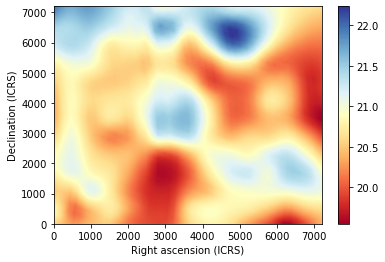

In [16]:
S.viewslice(S.patch_map)

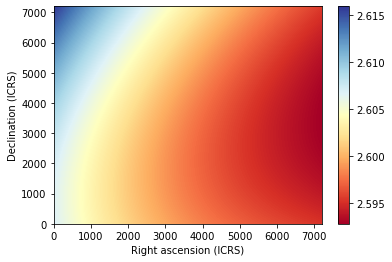

In [17]:
S.viewslice(S.patch_id)

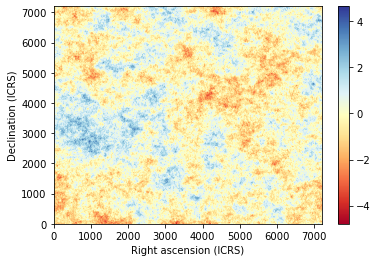

In [18]:
S.viewslice(S.patch_gss)

In [19]:
smoothed_input_map = S.smooth_sky(0.2, S.skypatch)

2022-08-13 13:29:05,066 : smooth_sky : INFO : Smoothing the <Ut.sky.SkyPatch object at 0x7ffb7bf5c450> with a Gaussian filter ...
2022-08-13 13:31:41,324 : smooth_sky : INFO : Smoothed sky patch using Gaussian filter of sigma = 336.00 [pixel]


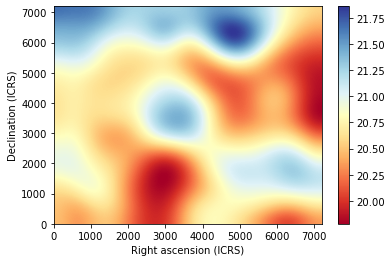

In [20]:
S.viewslice(smoothed_input_map)

In [21]:
S.skypatch.data = smoothed_input_map

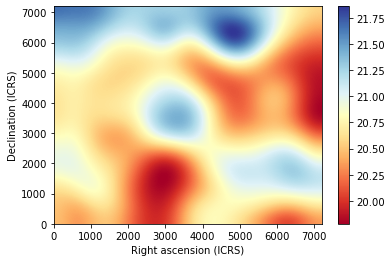

In [22]:
S.viewslice(S.skypatch.data)

### Simulate one freq

In [23]:
F158 = S.simulate_frequency(158,skytype='patch')

2022-08-13 13:31:47,070 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.00 [MHz] ...
2022-08-13 13:31:51,629 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:31:56,796 : simulate_frequency : INFO : Done simulate map at 158.00 [MHz].


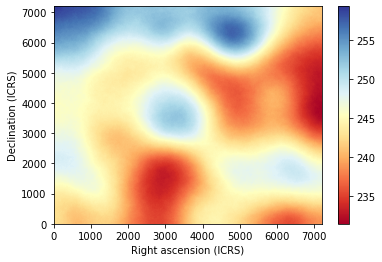

In [24]:
S.viewslice(F158.data)

### Simulate full freq bands

In [25]:
def do_simulation( freqlist, T, outdir ):
    T.output_dir = outdir
    for i in freqlist:
        sky = T.simulate(i, skytype='patch', smooth=False)
        print(sky)
        hdu = fits.open(sky[0])
        T.viewslice(hdu[0].data)

##### Low band

2022-08-13 13:31:59,518 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:31:59,519 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.00 [MHz] ...
2022-08-13 13:32:04,058 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:32:09,219 : simulate_frequency : INFO : Done simulate map at 120.00 [MHz].
2022-08-13 13:32:09,931 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_120.00.fits']


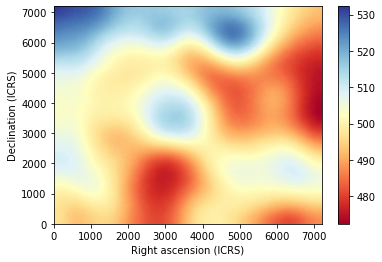

2022-08-13 13:32:11,800 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:11,801 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.16 [MHz] ...
2022-08-13 13:32:16,337 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:32:21,488 : simulate_frequency : INFO : Done simulate map at 120.16 [MHz].
2022-08-13 13:32:21,823 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_120.16.fits']


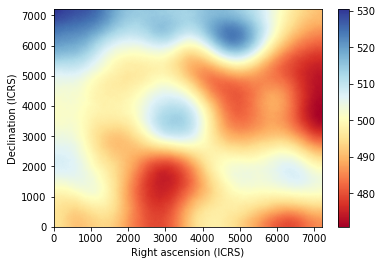

2022-08-13 13:32:23,701 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:23,702 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.32 [MHz] ...
2022-08-13 13:32:28,258 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:32:33,501 : simulate_frequency : INFO : Done simulate map at 120.32 [MHz].
2022-08-13 13:32:33,785 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_120.32.fits']


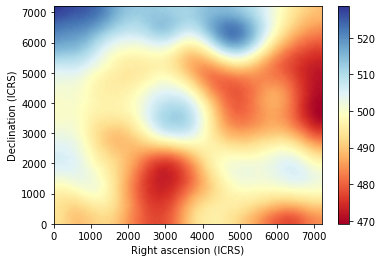

2022-08-13 13:32:35,666 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:35,667 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.48 [MHz] ...
2022-08-13 13:32:40,199 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:32:46,264 : simulate_frequency : INFO : Done simulate map at 120.48 [MHz].
2022-08-13 13:32:46,546 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_120.48.fits']


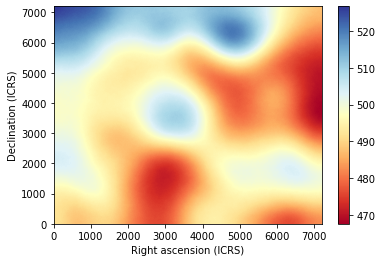

2022-08-13 13:32:48,430 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:32:48,431 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.64 [MHz] ...
2022-08-13 13:32:52,964 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:32:58,122 : simulate_frequency : INFO : Done simulate map at 120.64 [MHz].
2022-08-13 13:32:58,406 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_120.64.fits']


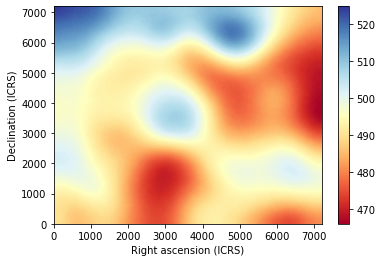

2022-08-13 13:33:00,289 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:00,290 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.80 [MHz] ...
2022-08-13 13:33:04,832 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:33:09,997 : simulate_frequency : INFO : Done simulate map at 120.80 [MHz].
2022-08-13 13:33:10,280 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_120.80.fits']


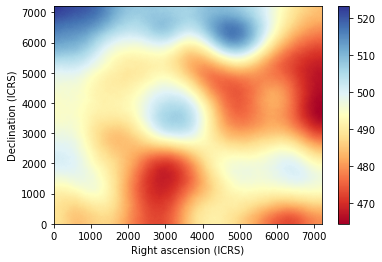

2022-08-13 13:33:12,163 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:12,164 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.96 [MHz] ...
2022-08-13 13:33:16,705 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:33:21,858 : simulate_frequency : INFO : Done simulate map at 120.96 [MHz].
2022-08-13 13:33:22,217 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_120.96.fits']


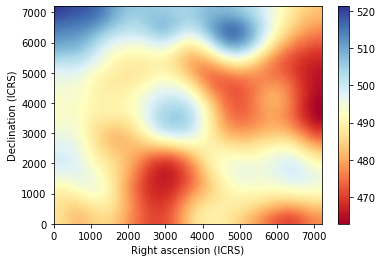

2022-08-13 13:33:24,092 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:24,093 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.12 [MHz] ...
2022-08-13 13:33:28,631 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:33:33,791 : simulate_frequency : INFO : Done simulate map at 121.12 [MHz].
2022-08-13 13:33:34,072 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_121.12.fits']


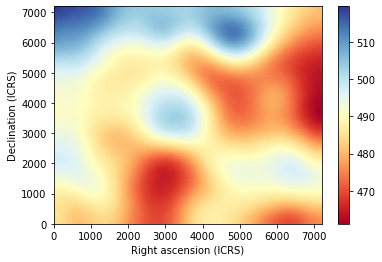

2022-08-13 13:33:35,947 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:35,948 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.28 [MHz] ...
2022-08-13 13:33:40,487 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:33:45,642 : simulate_frequency : INFO : Done simulate map at 121.28 [MHz].
2022-08-13 13:33:45,924 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_121.28.fits']


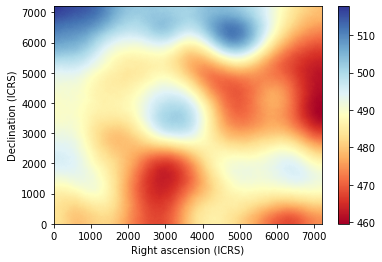

2022-08-13 13:33:47,798 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:47,800 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.44 [MHz] ...
2022-08-13 13:33:52,336 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:33:57,498 : simulate_frequency : INFO : Done simulate map at 121.44 [MHz].
2022-08-13 13:33:57,781 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_121.44.fits']


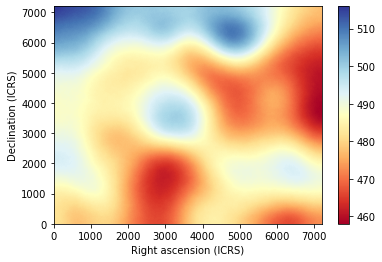

2022-08-13 13:33:59,654 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:33:59,655 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.60 [MHz] ...
2022-08-13 13:34:04,194 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:34:09,353 : simulate_frequency : INFO : Done simulate map at 121.60 [MHz].
2022-08-13 13:34:09,636 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_121.60.fits']


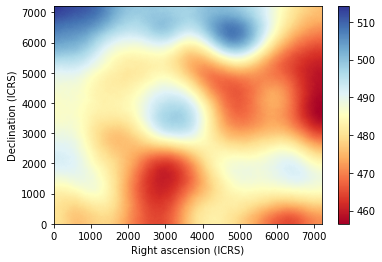

2022-08-13 13:34:11,512 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:11,514 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.76 [MHz] ...
2022-08-13 13:34:16,052 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:34:21,212 : simulate_frequency : INFO : Done simulate map at 121.76 [MHz].
2022-08-13 13:34:21,496 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_121.76.fits']


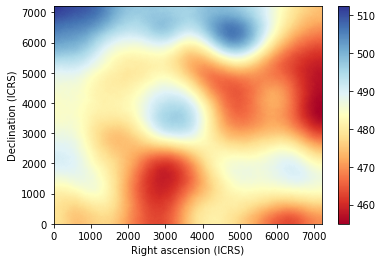

2022-08-13 13:34:23,652 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:23,653 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.92 [MHz] ...
2022-08-13 13:34:28,273 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:34:33,433 : simulate_frequency : INFO : Done simulate map at 121.92 [MHz].
2022-08-13 13:34:33,803 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_121.92.fits']


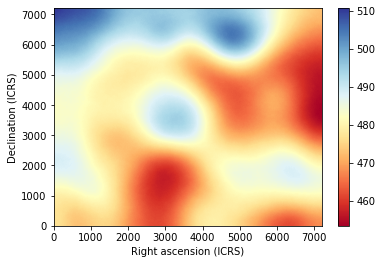

2022-08-13 13:34:35,687 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:35,689 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.08 [MHz] ...
2022-08-13 13:34:40,228 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:34:45,863 : simulate_frequency : INFO : Done simulate map at 122.08 [MHz].
2022-08-13 13:34:46,152 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_122.08.fits']


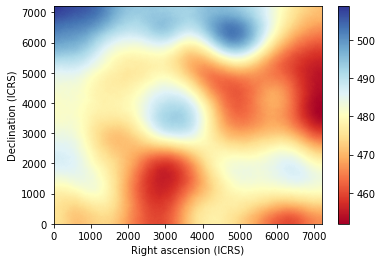

2022-08-13 13:34:48,026 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:34:48,027 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.24 [MHz] ...
2022-08-13 13:34:52,790 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:34:57,944 : simulate_frequency : INFO : Done simulate map at 122.24 [MHz].
2022-08-13 13:34:58,225 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_122.24.fits']


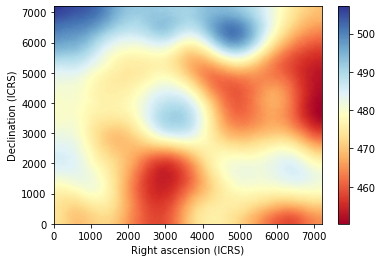

2022-08-13 13:35:00,102 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:00,103 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.40 [MHz] ...
2022-08-13 13:35:04,637 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:35:09,791 : simulate_frequency : INFO : Done simulate map at 122.40 [MHz].
2022-08-13 13:35:10,087 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_122.40.fits']


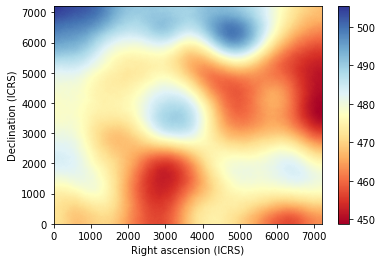

2022-08-13 13:35:11,961 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:11,962 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.56 [MHz] ...
2022-08-13 13:35:16,501 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:35:21,659 : simulate_frequency : INFO : Done simulate map at 122.56 [MHz].
2022-08-13 13:35:21,942 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_122.56.fits']


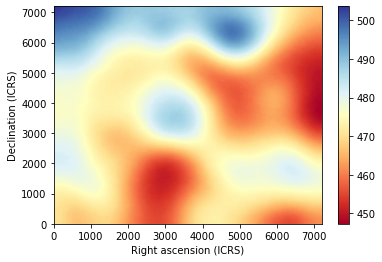

2022-08-13 13:35:23,829 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:23,830 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.72 [MHz] ...
2022-08-13 13:35:28,372 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:35:33,532 : simulate_frequency : INFO : Done simulate map at 122.72 [MHz].
2022-08-13 13:35:33,816 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_122.72.fits']


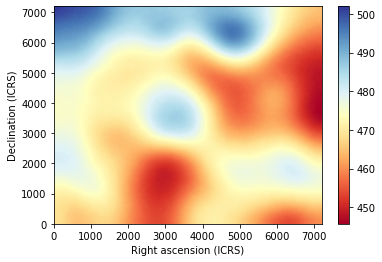

2022-08-13 13:35:35,693 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:35,694 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.88 [MHz] ...
2022-08-13 13:35:40,233 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:35:45,385 : simulate_frequency : INFO : Done simulate map at 122.88 [MHz].
2022-08-13 13:35:45,667 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_122.88.fits']


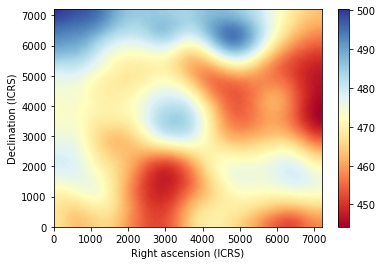

2022-08-13 13:35:47,550 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:47,551 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.04 [MHz] ...
2022-08-13 13:35:52,090 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:35:57,247 : simulate_frequency : INFO : Done simulate map at 123.04 [MHz].
2022-08-13 13:35:57,530 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_123.04.fits']


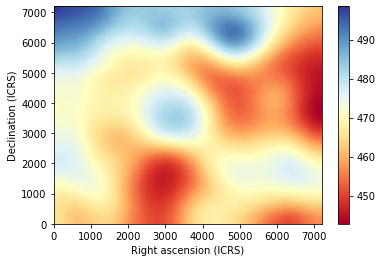

2022-08-13 13:35:59,406 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:35:59,407 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.20 [MHz] ...
2022-08-13 13:36:04,517 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:36:09,560 : simulate_frequency : INFO : Done simulate map at 123.20 [MHz].
2022-08-13 13:36:09,934 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_123.20.fits']


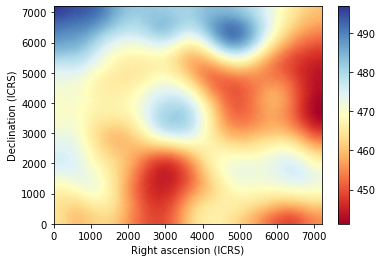

2022-08-13 13:36:11,808 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:36:11,810 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.36 [MHz] ...
2022-08-13 13:36:16,251 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:36:21,242 : simulate_frequency : INFO : Done simulate map at 123.36 [MHz].
2022-08-13 13:36:21,524 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_123.36.fits']


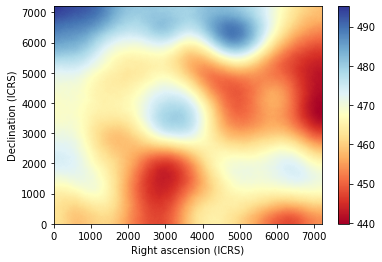

2022-08-13 13:36:23,394 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:36:23,396 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.52 [MHz] ...
2022-08-13 13:36:27,663 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:36:32,441 : simulate_frequency : INFO : Done simulate map at 123.52 [MHz].
2022-08-13 13:36:32,725 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_123.52.fits']


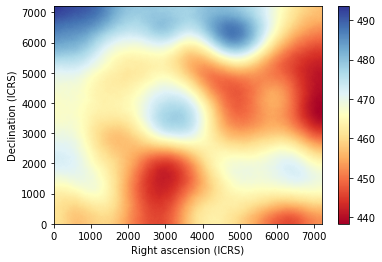

2022-08-13 13:36:34,897 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:36:34,899 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.68 [MHz] ...
2022-08-13 13:36:39,174 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:36:43,935 : simulate_frequency : INFO : Done simulate map at 123.68 [MHz].
2022-08-13 13:36:44,221 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_123.68.fits']


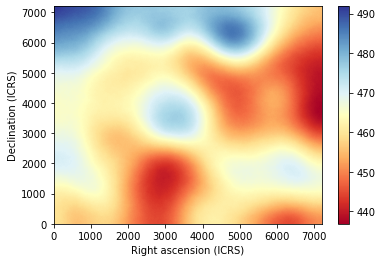

2022-08-13 13:36:46,094 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:36:46,096 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.84 [MHz] ...
2022-08-13 13:36:50,367 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:36:55,131 : simulate_frequency : INFO : Done simulate map at 123.84 [MHz].
2022-08-13 13:36:55,414 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_123.84.fits']


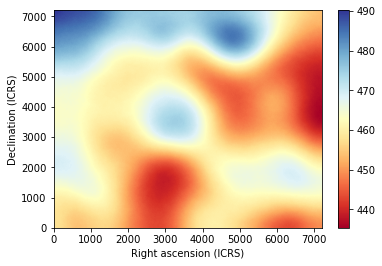

2022-08-13 13:36:57,279 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:36:57,282 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.00 [MHz] ...
2022-08-13 13:37:01,573 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:37:06,336 : simulate_frequency : INFO : Done simulate map at 124.00 [MHz].
2022-08-13 13:37:06,618 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_124.00.fits']


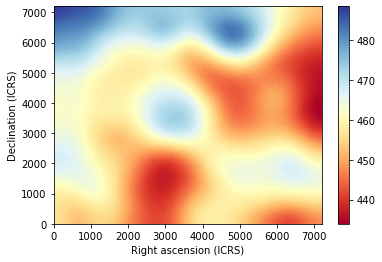

2022-08-13 13:37:08,483 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:37:08,485 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.16 [MHz] ...
2022-08-13 13:37:12,759 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:37:17,525 : simulate_frequency : INFO : Done simulate map at 124.16 [MHz].
2022-08-13 13:37:17,820 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_124.16.fits']


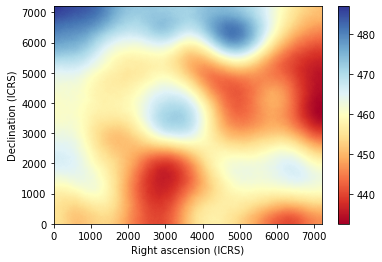

2022-08-13 13:37:19,682 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:37:19,684 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.32 [MHz] ...
2022-08-13 13:37:23,953 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:37:28,722 : simulate_frequency : INFO : Done simulate map at 124.32 [MHz].
2022-08-13 13:37:29,153 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_124.32.fits']


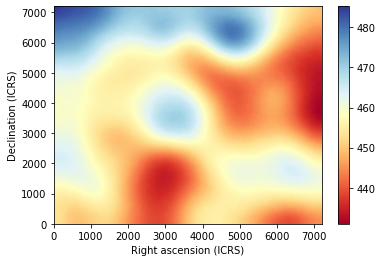

2022-08-13 13:37:31,012 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:37:31,014 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.48 [MHz] ...
2022-08-13 13:37:35,281 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:37:40,039 : simulate_frequency : INFO : Done simulate map at 124.48 [MHz].
2022-08-13 13:37:40,323 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_124.48.fits']


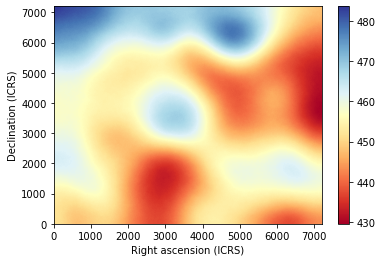

2022-08-13 13:37:42,196 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:37:42,198 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.64 [MHz] ...
2022-08-13 13:37:46,463 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:37:51,222 : simulate_frequency : INFO : Done simulate map at 124.64 [MHz].
2022-08-13 13:37:51,504 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_124.64.fits']


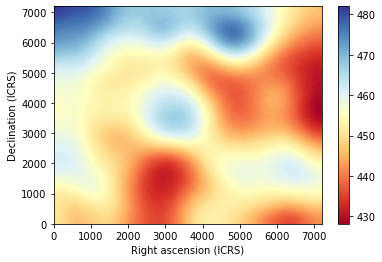

2022-08-13 13:37:53,370 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:37:53,372 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.80 [MHz] ...
2022-08-13 13:37:57,637 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:38:02,403 : simulate_frequency : INFO : Done simulate map at 124.80 [MHz].
2022-08-13 13:38:02,684 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_124.80.fits']


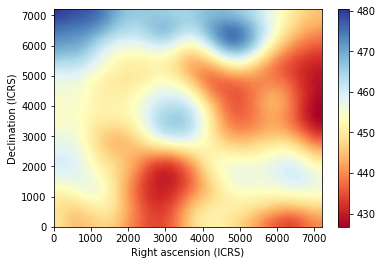

2022-08-13 13:38:04,547 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:38:04,549 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.96 [MHz] ...
2022-08-13 13:38:08,812 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:38:13,571 : simulate_frequency : INFO : Done simulate map at 124.96 [MHz].
2022-08-13 13:38:13,862 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_124.96.fits']


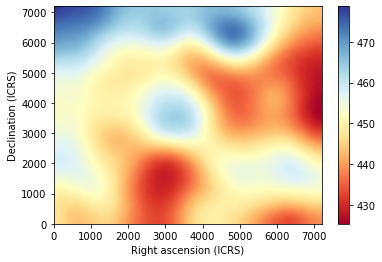

2022-08-13 13:38:15,732 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:38:15,733 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.12 [MHz] ...
2022-08-13 13:38:19,996 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:38:24,758 : simulate_frequency : INFO : Done simulate map at 125.12 [MHz].
2022-08-13 13:38:25,077 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_125.12.fits']


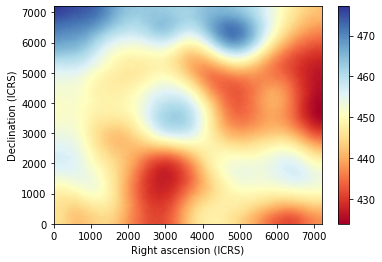

2022-08-13 13:38:26,942 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:38:26,944 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.28 [MHz] ...
2022-08-13 13:38:31,210 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:38:35,975 : simulate_frequency : INFO : Done simulate map at 125.28 [MHz].
2022-08-13 13:38:36,296 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_125.28.fits']


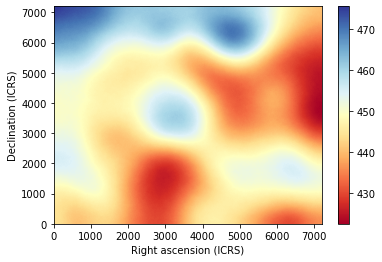

2022-08-13 13:38:38,413 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:38:38,415 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.44 [MHz] ...
2022-08-13 13:38:42,682 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:38:47,855 : simulate_frequency : INFO : Done simulate map at 125.44 [MHz].
2022-08-13 13:38:48,196 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_125.44.fits']


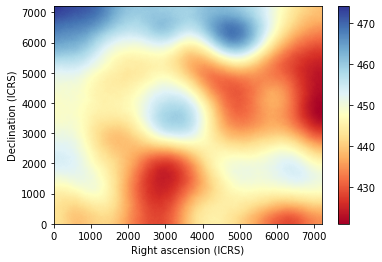

2022-08-13 13:38:50,271 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:38:50,273 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.60 [MHz] ...
2022-08-13 13:38:55,010 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:38:59,769 : simulate_frequency : INFO : Done simulate map at 125.60 [MHz].
2022-08-13 13:39:00,103 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_125.60.fits']


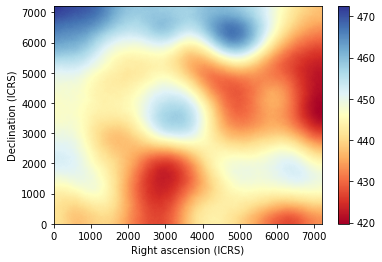

2022-08-13 13:39:01,971 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:39:01,973 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.76 [MHz] ...
2022-08-13 13:39:06,241 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:39:10,999 : simulate_frequency : INFO : Done simulate map at 125.76 [MHz].
2022-08-13 13:39:11,280 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_125.76.fits']


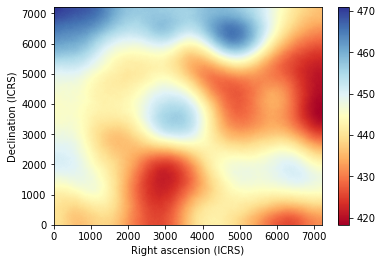

2022-08-13 13:39:13,148 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:39:13,150 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.92 [MHz] ...
2022-08-13 13:39:17,419 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:39:22,183 : simulate_frequency : INFO : Done simulate map at 125.92 [MHz].
2022-08-13 13:39:22,465 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_125.92.fits']


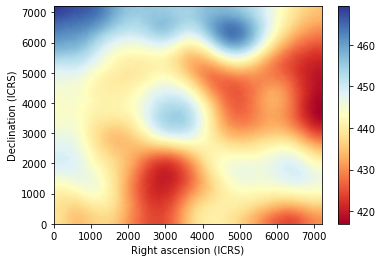

2022-08-13 13:39:24,324 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:39:24,325 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.08 [MHz] ...
2022-08-13 13:39:28,593 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:39:33,358 : simulate_frequency : INFO : Done simulate map at 126.08 [MHz].
2022-08-13 13:39:33,639 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_126.08.fits']


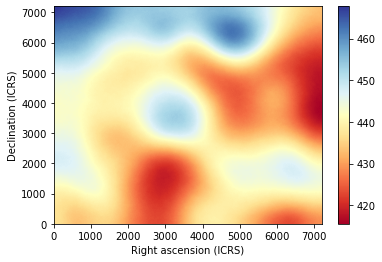

2022-08-13 13:39:35,505 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:39:35,506 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.24 [MHz] ...
2022-08-13 13:39:39,775 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:39:44,535 : simulate_frequency : INFO : Done simulate map at 126.24 [MHz].
2022-08-13 13:39:44,869 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_126.24.fits']


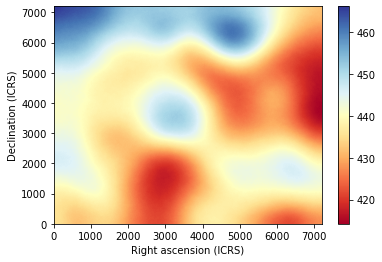

2022-08-13 13:39:46,729 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:39:46,730 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.40 [MHz] ...
2022-08-13 13:39:50,997 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:39:55,764 : simulate_frequency : INFO : Done simulate map at 126.40 [MHz].
2022-08-13 13:39:56,096 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_126.40.fits']


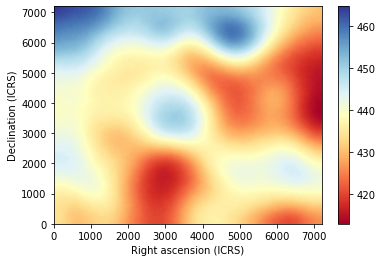

2022-08-13 13:39:57,958 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:39:57,960 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.56 [MHz] ...
2022-08-13 13:40:02,315 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:40:07,076 : simulate_frequency : INFO : Done simulate map at 126.56 [MHz].
2022-08-13 13:40:07,358 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_126.56.fits']


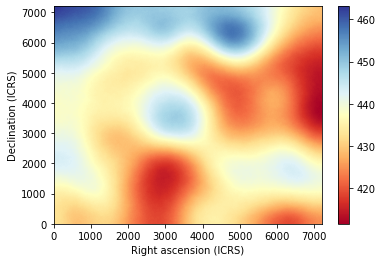

2022-08-13 13:40:09,218 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:40:09,219 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.72 [MHz] ...
2022-08-13 13:40:13,605 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:40:18,364 : simulate_frequency : INFO : Done simulate map at 126.72 [MHz].
2022-08-13 13:40:18,683 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_126.72.fits']


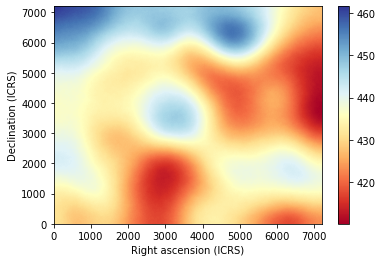

2022-08-13 13:40:20,546 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:40:20,547 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.88 [MHz] ...
2022-08-13 13:40:24,936 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:40:29,699 : simulate_frequency : INFO : Done simulate map at 126.88 [MHz].
2022-08-13 13:40:30,001 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_126.88.fits']


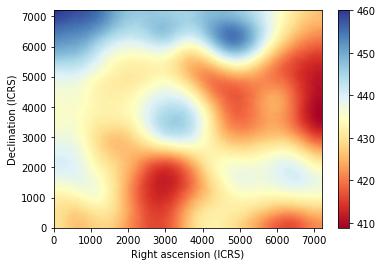

2022-08-13 13:40:31,868 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:40:31,870 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.04 [MHz] ...
2022-08-13 13:40:36,136 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:40:40,900 : simulate_frequency : INFO : Done simulate map at 127.04 [MHz].
2022-08-13 13:40:41,183 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_127.04.fits']


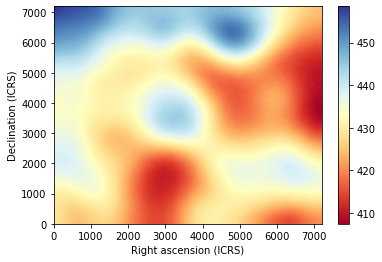

2022-08-13 13:40:43,302 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:40:43,304 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.20 [MHz] ...
2022-08-13 13:40:47,572 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:40:52,333 : simulate_frequency : INFO : Done simulate map at 127.20 [MHz].
2022-08-13 13:40:52,615 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_127.20.fits']


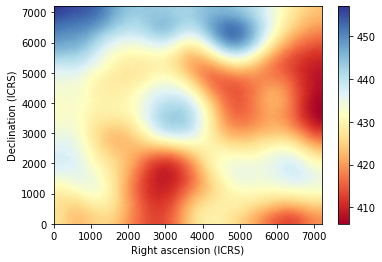

2022-08-13 13:40:54,479 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:40:54,480 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.36 [MHz] ...
2022-08-13 13:40:58,749 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:41:03,509 : simulate_frequency : INFO : Done simulate map at 127.36 [MHz].
2022-08-13 13:41:03,791 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_127.36.fits']


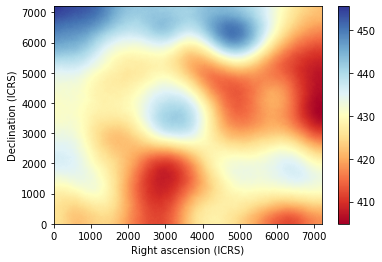

2022-08-13 13:41:05,654 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:41:05,655 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.52 [MHz] ...
2022-08-13 13:41:09,924 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:41:15,091 : simulate_frequency : INFO : Done simulate map at 127.52 [MHz].
2022-08-13 13:41:15,376 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_127.52.fits']


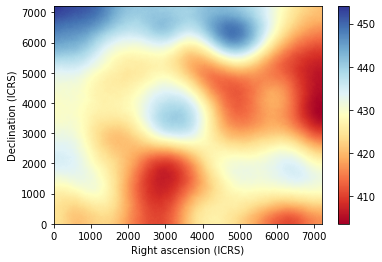

2022-08-13 13:41:17,572 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:41:17,574 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.68 [MHz] ...
2022-08-13 13:41:22,196 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:41:27,113 : simulate_frequency : INFO : Done simulate map at 127.68 [MHz].
2022-08-13 13:41:27,397 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_127.68.fits']


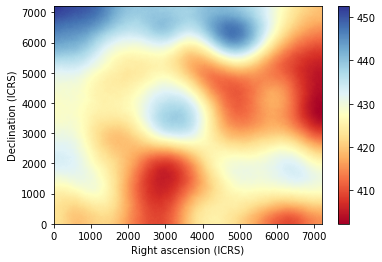

2022-08-13 13:41:29,260 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:41:29,262 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.84 [MHz] ...
2022-08-13 13:41:33,529 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:41:38,338 : simulate_frequency : INFO : Done simulate map at 127.84 [MHz].
2022-08-13 13:41:38,724 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_127.84.fits']


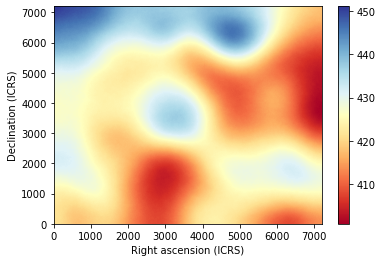

2022-08-13 13:41:40,925 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:41:40,927 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 128.00 [MHz] ...
2022-08-13 13:41:45,358 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:41:50,118 : simulate_frequency : INFO : Done simulate map at 128.00 [MHz].
2022-08-13 13:41:50,400 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_0-27_128.00.fits']


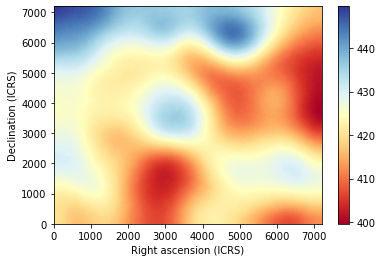

In [26]:
do_simulation(S.freqs['low']['f'], S, s_outlow)

##### Mid band

2022-08-13 13:41:52,274 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:41:52,277 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.00 [MHz] ...
2022-08-13 13:41:56,570 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:42:01,343 : simulate_frequency : INFO : Done simulate map at 154.00 [MHz].
2022-08-13 13:42:01,625 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_154.00.fits']


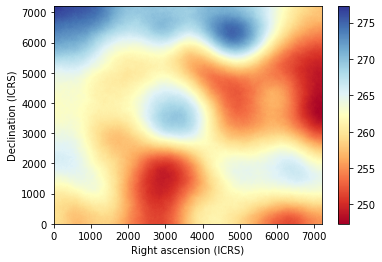

2022-08-13 13:42:03,486 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:42:03,488 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.16 [MHz] ...
2022-08-13 13:42:07,775 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:42:12,543 : simulate_frequency : INFO : Done simulate map at 154.16 [MHz].
2022-08-13 13:42:12,824 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_154.16.fits']


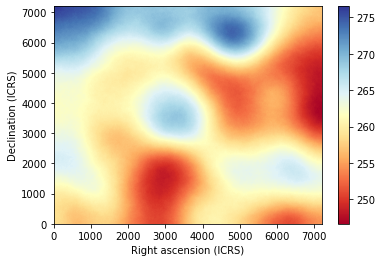

2022-08-13 13:42:14,695 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:42:14,697 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.32 [MHz] ...
2022-08-13 13:42:18,986 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:42:23,756 : simulate_frequency : INFO : Done simulate map at 154.32 [MHz].
2022-08-13 13:42:24,038 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_154.32.fits']


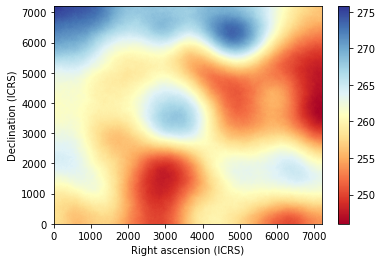

2022-08-13 13:42:25,905 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:42:25,907 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.48 [MHz] ...
2022-08-13 13:42:30,196 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:42:34,966 : simulate_frequency : INFO : Done simulate map at 154.48 [MHz].
2022-08-13 13:42:35,316 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_154.48.fits']


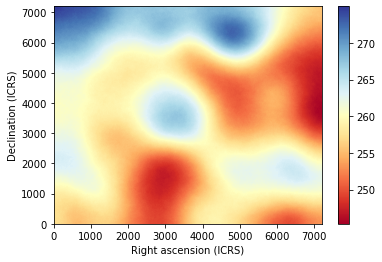

2022-08-13 13:42:37,183 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:42:37,185 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.64 [MHz] ...
2022-08-13 13:42:41,474 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:42:46,244 : simulate_frequency : INFO : Done simulate map at 154.64 [MHz].
2022-08-13 13:42:46,565 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_154.64.fits']


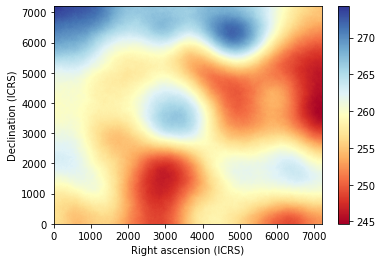

2022-08-13 13:42:48,694 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:42:48,696 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.80 [MHz] ...
2022-08-13 13:42:52,995 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:42:57,767 : simulate_frequency : INFO : Done simulate map at 154.80 [MHz].
2022-08-13 13:42:58,049 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_154.80.fits']


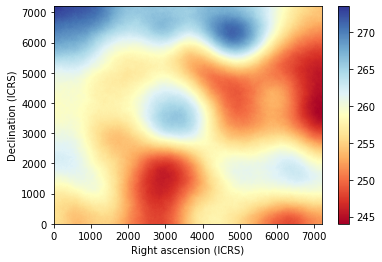

2022-08-13 13:42:59,922 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:42:59,924 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.96 [MHz] ...
2022-08-13 13:43:04,221 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:43:08,993 : simulate_frequency : INFO : Done simulate map at 154.96 [MHz].
2022-08-13 13:43:09,274 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_154.96.fits']


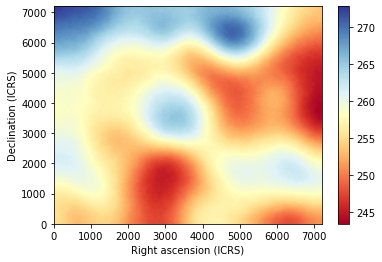

2022-08-13 13:43:11,142 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:43:11,143 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.12 [MHz] ...
2022-08-13 13:43:15,439 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:43:20,208 : simulate_frequency : INFO : Done simulate map at 155.12 [MHz].
2022-08-13 13:43:20,913 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_155.12.fits']


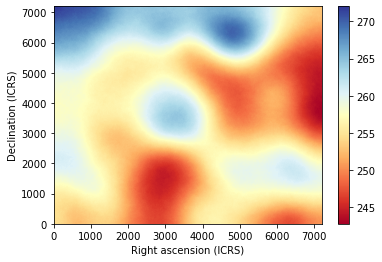

2022-08-13 13:43:22,780 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:43:22,781 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.28 [MHz] ...
2022-08-13 13:43:27,070 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:43:31,833 : simulate_frequency : INFO : Done simulate map at 155.28 [MHz].
2022-08-13 13:43:32,114 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_155.28.fits']


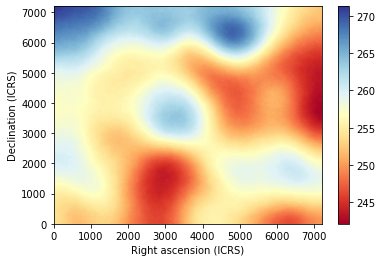

2022-08-13 13:43:33,981 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:43:33,982 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.44 [MHz] ...
2022-08-13 13:43:38,272 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:43:43,036 : simulate_frequency : INFO : Done simulate map at 155.44 [MHz].
2022-08-13 13:43:43,317 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_155.44.fits']


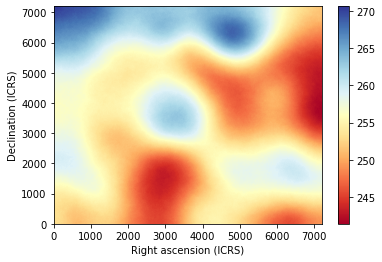

2022-08-13 13:43:45,187 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:43:45,188 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.60 [MHz] ...
2022-08-13 13:43:49,479 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:43:54,247 : simulate_frequency : INFO : Done simulate map at 155.60 [MHz].
2022-08-13 13:43:54,528 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_155.60.fits']


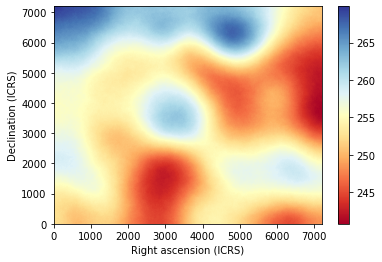

2022-08-13 13:43:56,394 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:43:56,395 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.76 [MHz] ...
2022-08-13 13:44:00,682 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:44:05,444 : simulate_frequency : INFO : Done simulate map at 155.76 [MHz].
2022-08-13 13:44:05,726 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_155.76.fits']


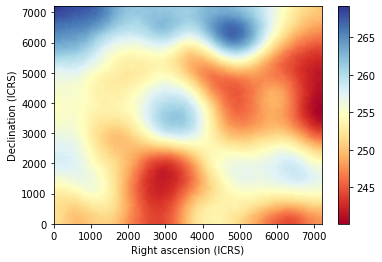

2022-08-13 13:44:07,594 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:44:07,595 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.92 [MHz] ...
2022-08-13 13:44:11,881 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:44:16,643 : simulate_frequency : INFO : Done simulate map at 155.92 [MHz].
2022-08-13 13:44:16,925 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_155.92.fits']


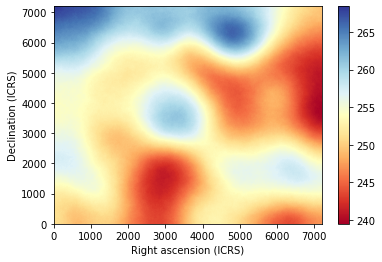

2022-08-13 13:44:18,792 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:44:18,794 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.08 [MHz] ...
2022-08-13 13:44:23,081 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:44:27,845 : simulate_frequency : INFO : Done simulate map at 156.08 [MHz].
2022-08-13 13:44:28,126 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_156.08.fits']


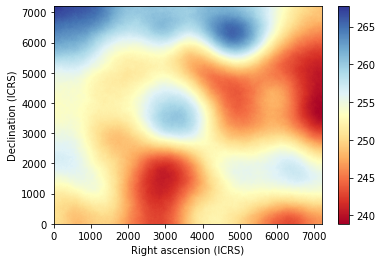

2022-08-13 13:44:29,997 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:44:29,998 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.24 [MHz] ...
2022-08-13 13:44:34,286 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:44:39,048 : simulate_frequency : INFO : Done simulate map at 156.24 [MHz].
2022-08-13 13:44:39,329 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_156.24.fits']


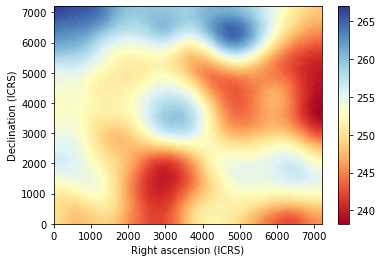

2022-08-13 13:44:41,202 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:44:41,204 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.40 [MHz] ...
2022-08-13 13:44:45,493 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:44:50,257 : simulate_frequency : INFO : Done simulate map at 156.40 [MHz].
2022-08-13 13:44:50,539 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_156.40.fits']


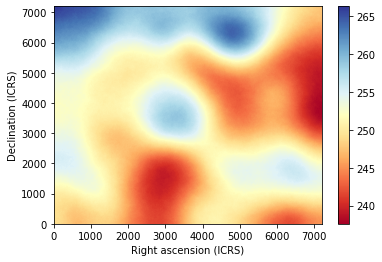

2022-08-13 13:44:52,658 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:44:52,659 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.56 [MHz] ...
2022-08-13 13:44:56,949 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:45:01,713 : simulate_frequency : INFO : Done simulate map at 156.56 [MHz].
2022-08-13 13:45:01,994 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_156.56.fits']


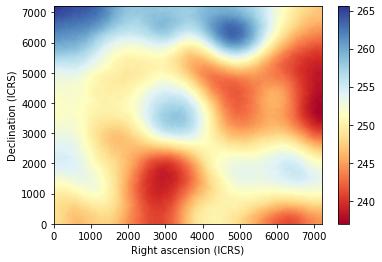

2022-08-13 13:45:03,863 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:45:03,864 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.72 [MHz] ...
2022-08-13 13:45:08,157 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:45:12,965 : simulate_frequency : INFO : Done simulate map at 156.72 [MHz].
2022-08-13 13:45:13,340 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_156.72.fits']


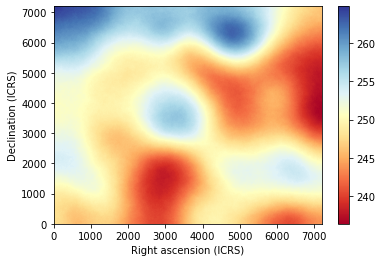

2022-08-13 13:45:15,204 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:45:15,205 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.88 [MHz] ...
2022-08-13 13:45:19,497 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:45:24,260 : simulate_frequency : INFO : Done simulate map at 156.88 [MHz].
2022-08-13 13:45:24,554 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_156.88.fits']


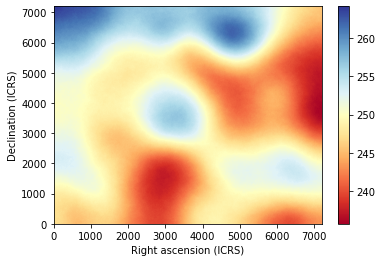

2022-08-13 13:45:26,419 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:45:26,420 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.04 [MHz] ...
2022-08-13 13:45:30,712 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:45:35,473 : simulate_frequency : INFO : Done simulate map at 157.04 [MHz].
2022-08-13 13:45:35,753 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_157.04.fits']


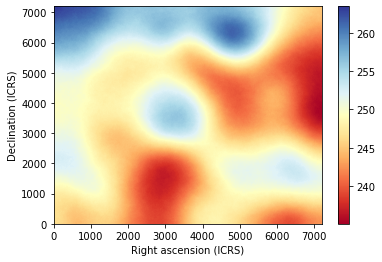

2022-08-13 13:45:37,612 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:45:37,614 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.20 [MHz] ...
2022-08-13 13:45:41,906 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:45:46,669 : simulate_frequency : INFO : Done simulate map at 157.20 [MHz].
2022-08-13 13:45:46,951 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_157.20.fits']


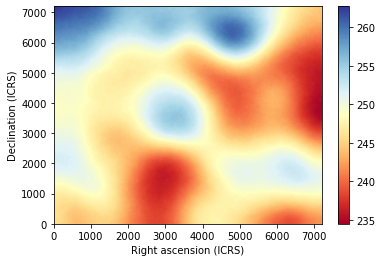

2022-08-13 13:45:48,822 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:45:48,824 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.36 [MHz] ...
2022-08-13 13:45:53,114 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:45:57,874 : simulate_frequency : INFO : Done simulate map at 157.36 [MHz].
2022-08-13 13:45:58,155 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_157.36.fits']


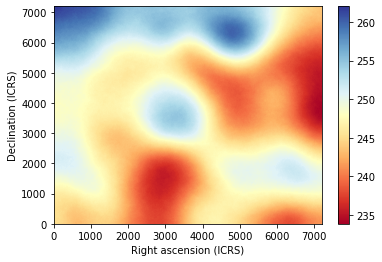

2022-08-13 13:46:00,020 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:46:00,022 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.52 [MHz] ...
2022-08-13 13:46:04,310 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:46:09,070 : simulate_frequency : INFO : Done simulate map at 157.52 [MHz].
2022-08-13 13:46:09,351 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_157.52.fits']


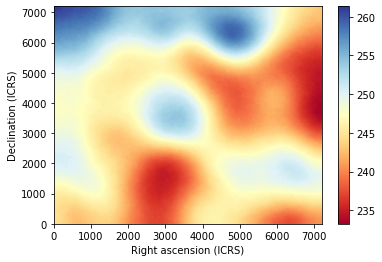

2022-08-13 13:46:11,219 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:46:11,220 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.68 [MHz] ...
2022-08-13 13:46:15,510 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:46:20,269 : simulate_frequency : INFO : Done simulate map at 157.68 [MHz].
2022-08-13 13:46:20,551 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_157.68.fits']


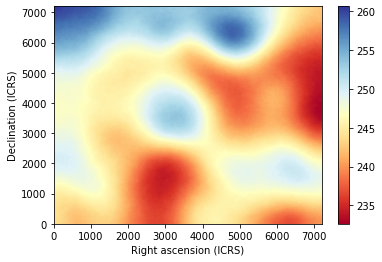

2022-08-13 13:46:22,424 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:46:22,425 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.84 [MHz] ...
2022-08-13 13:46:26,715 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:46:31,483 : simulate_frequency : INFO : Done simulate map at 157.84 [MHz].
2022-08-13 13:46:31,765 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_157.84.fits']


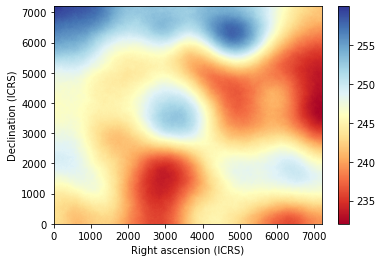

2022-08-13 13:46:33,635 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:46:33,637 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.00 [MHz] ...
2022-08-13 13:46:37,925 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:46:42,687 : simulate_frequency : INFO : Done simulate map at 158.00 [MHz].
2022-08-13 13:46:42,969 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_158.00.fits']


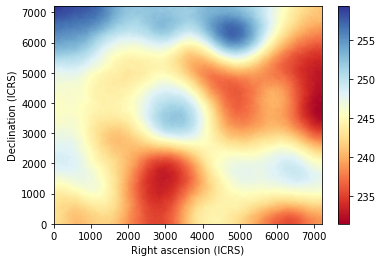

2022-08-13 13:46:44,837 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:46:44,838 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.16 [MHz] ...
2022-08-13 13:46:49,128 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:46:53,893 : simulate_frequency : INFO : Done simulate map at 158.16 [MHz].
2022-08-13 13:46:54,177 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_158.16.fits']


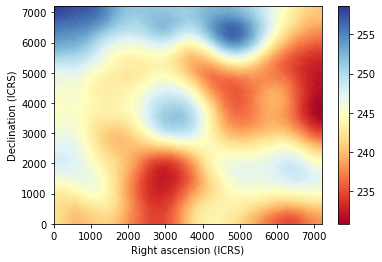

2022-08-13 13:46:56,297 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:46:56,299 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.32 [MHz] ...
2022-08-13 13:47:00,592 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:47:05,356 : simulate_frequency : INFO : Done simulate map at 158.32 [MHz].
2022-08-13 13:47:05,638 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_158.32.fits']


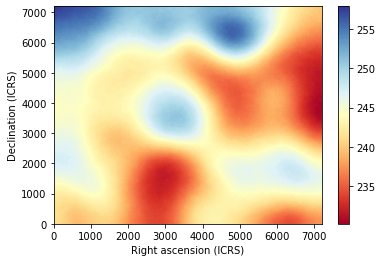

2022-08-13 13:47:07,503 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:47:07,504 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.48 [MHz] ...
2022-08-13 13:47:11,797 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:47:16,559 : simulate_frequency : INFO : Done simulate map at 158.48 [MHz].
2022-08-13 13:47:16,840 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_158.48.fits']


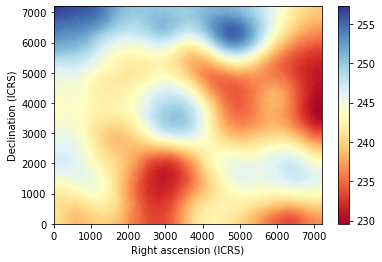

2022-08-13 13:47:18,705 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:47:18,706 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.64 [MHz] ...
2022-08-13 13:47:23,002 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:47:27,764 : simulate_frequency : INFO : Done simulate map at 158.64 [MHz].
2022-08-13 13:47:28,044 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_158.64.fits']


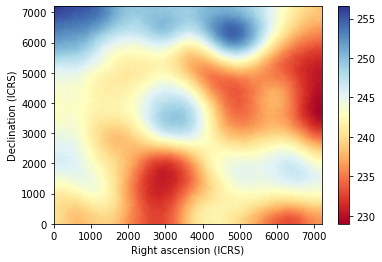

2022-08-13 13:47:29,917 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:47:29,918 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.80 [MHz] ...
2022-08-13 13:47:34,211 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:47:38,977 : simulate_frequency : INFO : Done simulate map at 158.80 [MHz].
2022-08-13 13:47:39,259 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_158.80.fits']


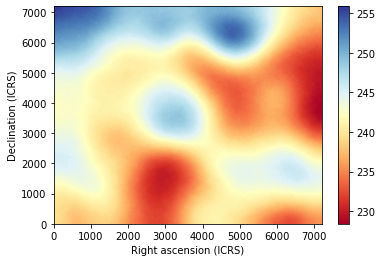

2022-08-13 13:47:41,128 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:47:41,129 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.96 [MHz] ...
2022-08-13 13:47:45,424 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:47:50,187 : simulate_frequency : INFO : Done simulate map at 158.96 [MHz].
2022-08-13 13:47:50,469 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_158.96.fits']


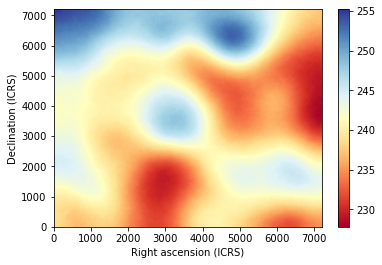

2022-08-13 13:47:52,340 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:47:52,342 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.12 [MHz] ...
2022-08-13 13:47:56,635 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:48:01,401 : simulate_frequency : INFO : Done simulate map at 159.12 [MHz].
2022-08-13 13:48:01,684 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_159.12.fits']


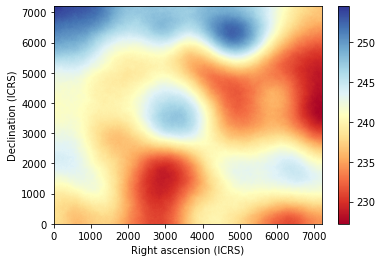

2022-08-13 13:48:03,553 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:48:03,555 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.28 [MHz] ...
2022-08-13 13:48:07,846 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:48:12,610 : simulate_frequency : INFO : Done simulate map at 159.28 [MHz].
2022-08-13 13:48:12,891 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_159.28.fits']


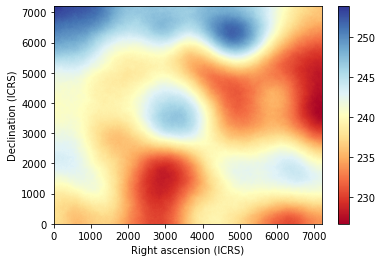

2022-08-13 13:48:14,762 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:48:14,763 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.44 [MHz] ...
2022-08-13 13:48:19,053 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:48:23,817 : simulate_frequency : INFO : Done simulate map at 159.44 [MHz].
2022-08-13 13:48:24,099 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_159.44.fits']


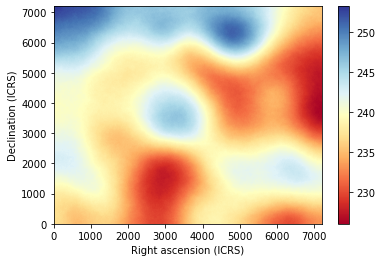

2022-08-13 13:48:25,967 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:48:25,968 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.60 [MHz] ...
2022-08-13 13:48:30,261 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:48:35,025 : simulate_frequency : INFO : Done simulate map at 159.60 [MHz].
2022-08-13 13:48:35,306 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_159.60.fits']


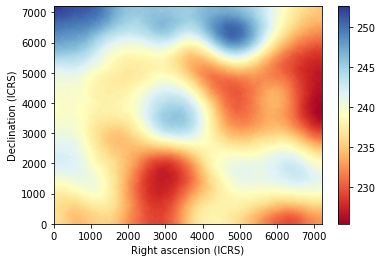

2022-08-13 13:48:37,172 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:48:37,173 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.76 [MHz] ...
2022-08-13 13:48:41,463 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:48:46,225 : simulate_frequency : INFO : Done simulate map at 159.76 [MHz].
2022-08-13 13:48:46,506 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_159.76.fits']


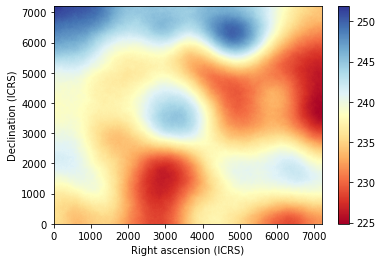

2022-08-13 13:48:48,376 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:48:48,378 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.92 [MHz] ...
2022-08-13 13:48:52,671 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:48:57,451 : simulate_frequency : INFO : Done simulate map at 159.92 [MHz].
2022-08-13 13:48:57,734 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_159.92.fits']


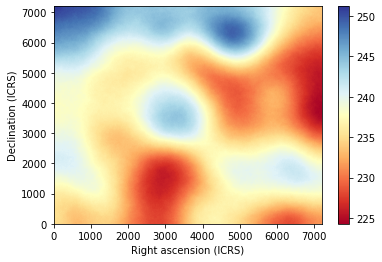

2022-08-13 13:48:59,858 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:48:59,860 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.08 [MHz] ...
2022-08-13 13:49:04,156 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:49:08,920 : simulate_frequency : INFO : Done simulate map at 160.08 [MHz].
2022-08-13 13:49:09,202 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_160.08.fits']


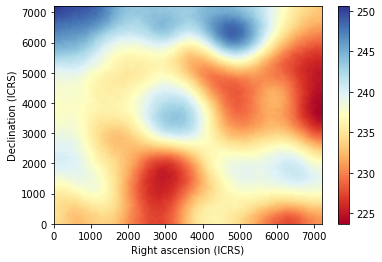

2022-08-13 13:49:11,072 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:49:11,073 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.24 [MHz] ...
2022-08-13 13:49:15,371 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:49:20,135 : simulate_frequency : INFO : Done simulate map at 160.24 [MHz].
2022-08-13 13:49:20,419 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_160.24.fits']


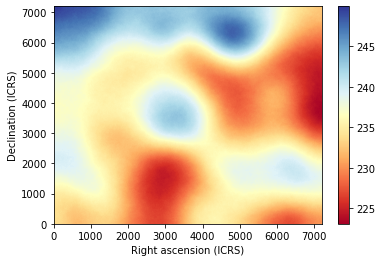

2022-08-13 13:49:22,286 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:49:22,288 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.40 [MHz] ...
2022-08-13 13:49:26,586 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:49:31,353 : simulate_frequency : INFO : Done simulate map at 160.40 [MHz].
2022-08-13 13:49:31,634 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_160.40.fits']


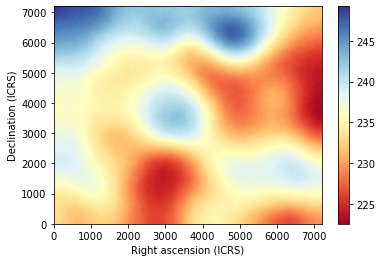

2022-08-13 13:49:33,497 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:49:33,498 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.56 [MHz] ...
2022-08-13 13:49:37,794 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:49:42,558 : simulate_frequency : INFO : Done simulate map at 160.56 [MHz].
2022-08-13 13:49:42,840 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_160.56.fits']


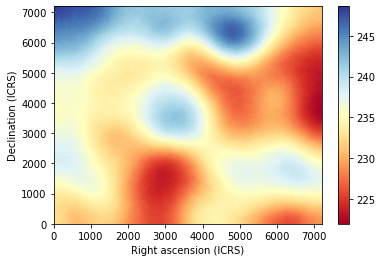

2022-08-13 13:49:44,707 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:49:44,708 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.72 [MHz] ...
2022-08-13 13:49:49,004 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:49:53,768 : simulate_frequency : INFO : Done simulate map at 160.72 [MHz].
2022-08-13 13:49:54,049 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_160.72.fits']


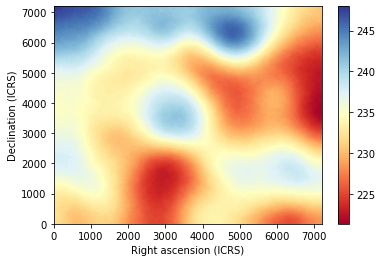

2022-08-13 13:49:55,914 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:49:55,916 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.88 [MHz] ...
2022-08-13 13:50:00,210 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:50:05,162 : simulate_frequency : INFO : Done simulate map at 160.88 [MHz].
2022-08-13 13:50:05,507 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_160.88.fits']


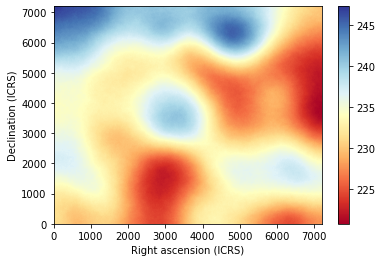

2022-08-13 13:50:07,379 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:50:07,381 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.04 [MHz] ...
2022-08-13 13:50:11,678 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:50:16,768 : simulate_frequency : INFO : Done simulate map at 161.04 [MHz].
2022-08-13 13:50:17,089 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_161.04.fits']


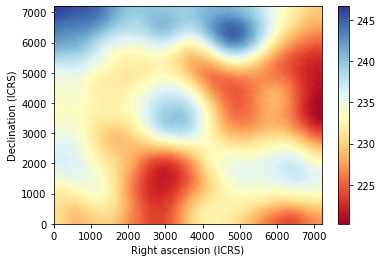

2022-08-13 13:50:18,970 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:50:18,972 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.20 [MHz] ...
2022-08-13 13:50:23,276 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:50:28,575 : simulate_frequency : INFO : Done simulate map at 161.20 [MHz].
2022-08-13 13:50:28,925 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_161.20.fits']


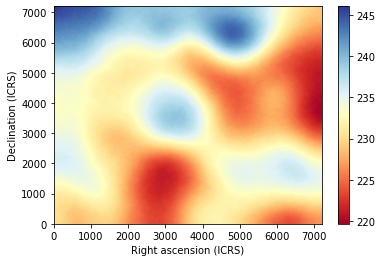

2022-08-13 13:50:30,811 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:50:30,813 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.36 [MHz] ...
2022-08-13 13:50:35,358 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:50:40,869 : simulate_frequency : INFO : Done simulate map at 161.36 [MHz].
2022-08-13 13:50:41,254 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_161.36.fits']


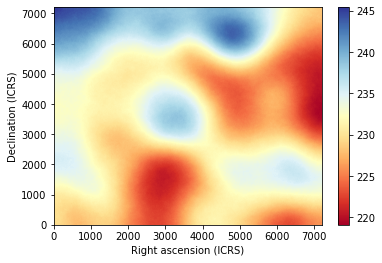

2022-08-13 13:50:43,136 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:50:43,137 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.52 [MHz] ...
2022-08-13 13:50:48,061 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:50:54,167 : simulate_frequency : INFO : Done simulate map at 161.52 [MHz].
2022-08-13 13:50:54,621 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_161.52.fits']


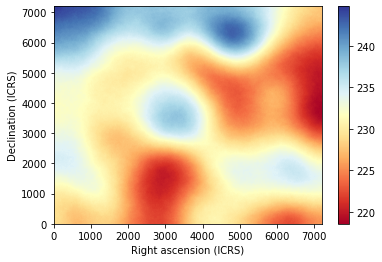

2022-08-13 13:50:57,256 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:50:57,257 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.68 [MHz] ...
2022-08-13 13:51:02,867 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:51:09,519 : simulate_frequency : INFO : Done simulate map at 161.68 [MHz].
2022-08-13 13:51:10,167 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_161.68.fits']


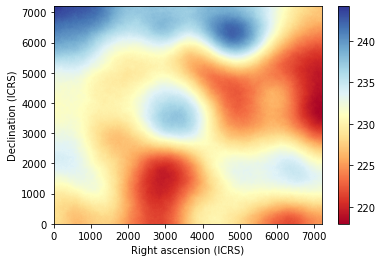

2022-08-13 13:51:12,377 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:51:12,378 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.84 [MHz] ...
2022-08-13 13:51:16,673 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:51:21,434 : simulate_frequency : INFO : Done simulate map at 161.84 [MHz].
2022-08-13 13:51:21,716 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_161.84.fits']


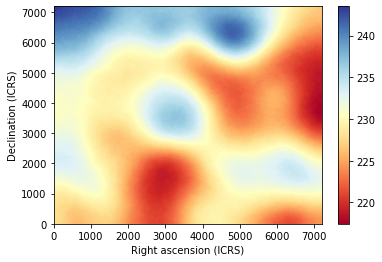

2022-08-13 13:51:23,583 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:51:23,584 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 162.00 [MHz] ...
2022-08-13 13:51:27,880 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:51:32,640 : simulate_frequency : INFO : Done simulate map at 162.00 [MHz].
2022-08-13 13:51:32,980 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_0-27_162.00.fits']


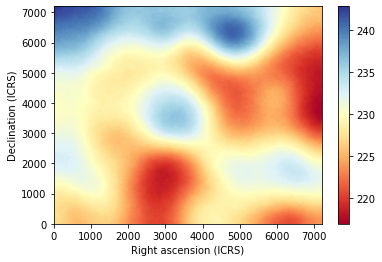

In [27]:
do_simulation(S.freqs['mid']['f'], S, s_outmid)

##### hig band

2022-08-13 13:51:34,860 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:51:34,861 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.00 [MHz] ...
2022-08-13 13:51:39,159 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:51:44,375 : simulate_frequency : INFO : Done simulate map at 188.00 [MHz].
2022-08-13 13:51:44,730 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_188.00.fits']


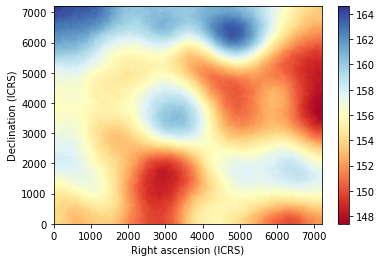

2022-08-13 13:51:46,624 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:51:46,626 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.16 [MHz] ...
2022-08-13 13:51:51,197 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:51:56,728 : simulate_frequency : INFO : Done simulate map at 188.16 [MHz].
2022-08-13 13:51:57,114 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_188.16.fits']


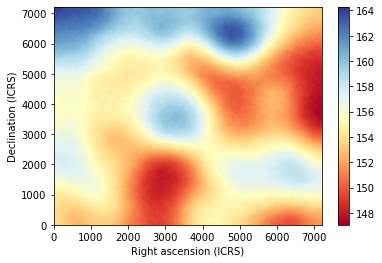

2022-08-13 13:51:59,016 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:51:59,017 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.32 [MHz] ...
2022-08-13 13:52:03,971 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:52:10,139 : simulate_frequency : INFO : Done simulate map at 188.32 [MHz].
2022-08-13 13:52:10,536 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_188.32.fits']


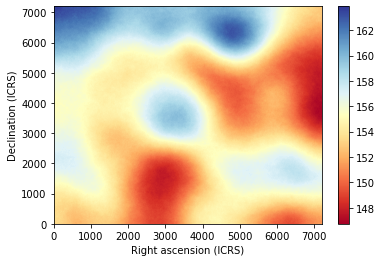

2022-08-13 13:52:13,460 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:52:13,462 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.48 [MHz] ...
2022-08-13 13:52:19,131 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:52:25,828 : simulate_frequency : INFO : Done simulate map at 188.48 [MHz].
2022-08-13 13:52:26,508 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_188.48.fits']


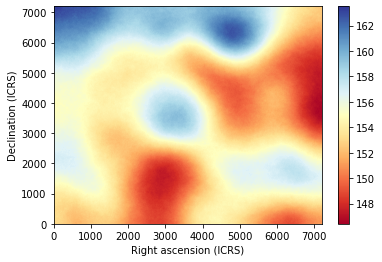

2022-08-13 13:52:31,009 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:52:31,011 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.64 [MHz] ...
2022-08-13 13:52:36,879 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:52:43,681 : simulate_frequency : INFO : Done simulate map at 188.64 [MHz].
2022-08-13 13:52:44,502 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_188.64.fits']


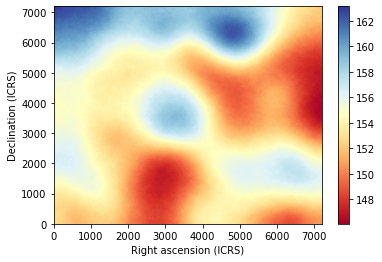

2022-08-13 13:52:49,424 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:52:49,426 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.80 [MHz] ...
2022-08-13 13:52:55,298 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:53:02,106 : simulate_frequency : INFO : Done simulate map at 188.80 [MHz].
2022-08-13 13:53:02,929 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_188.80.fits']


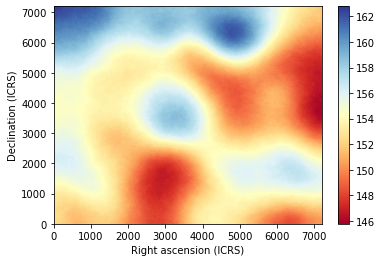

2022-08-13 13:53:07,865 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:53:07,867 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.96 [MHz] ...
2022-08-13 13:53:13,741 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:53:20,552 : simulate_frequency : INFO : Done simulate map at 188.96 [MHz].
2022-08-13 13:53:21,390 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_188.96.fits']


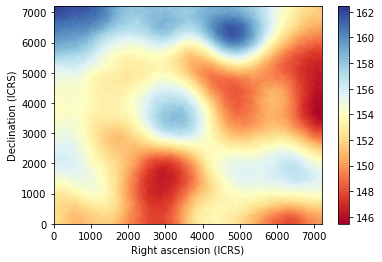

2022-08-13 13:53:26,329 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:53:26,331 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.12 [MHz] ...
2022-08-13 13:53:32,208 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:53:39,016 : simulate_frequency : INFO : Done simulate map at 189.12 [MHz].
2022-08-13 13:53:39,838 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_189.12.fits']


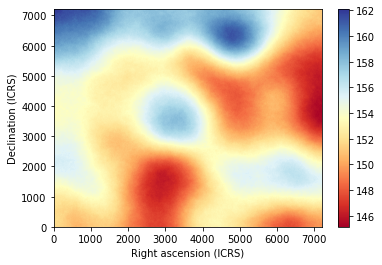

2022-08-13 13:53:44,775 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:53:44,776 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.28 [MHz] ...
2022-08-13 13:53:50,651 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:53:57,457 : simulate_frequency : INFO : Done simulate map at 189.28 [MHz].
2022-08-13 13:53:58,277 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_189.28.fits']


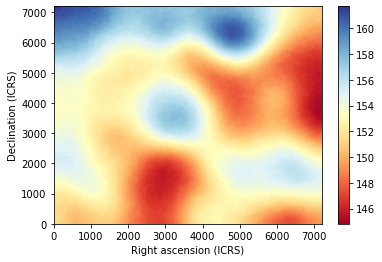

2022-08-13 13:54:00,539 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:54:00,541 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.44 [MHz] ...
2022-08-13 13:54:04,935 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:54:10,376 : simulate_frequency : INFO : Done simulate map at 189.44 [MHz].
2022-08-13 13:54:10,762 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_189.44.fits']


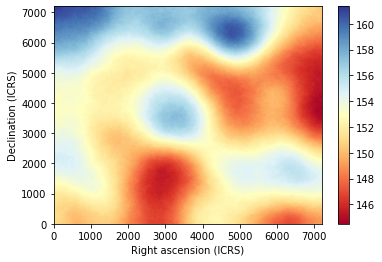

2022-08-13 13:54:12,653 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:54:12,654 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.60 [MHz] ...
2022-08-13 13:54:17,428 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:54:23,205 : simulate_frequency : INFO : Done simulate map at 189.60 [MHz].
2022-08-13 13:54:23,596 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_189.60.fits']


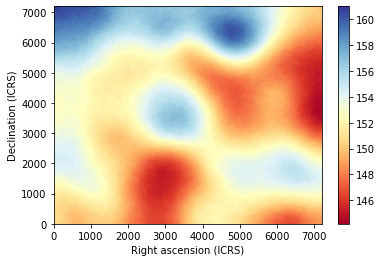

2022-08-13 13:54:25,489 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:54:25,490 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.76 [MHz] ...
2022-08-13 13:54:30,783 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:54:37,288 : simulate_frequency : INFO : Done simulate map at 189.76 [MHz].
2022-08-13 13:54:37,768 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_189.76.fits']


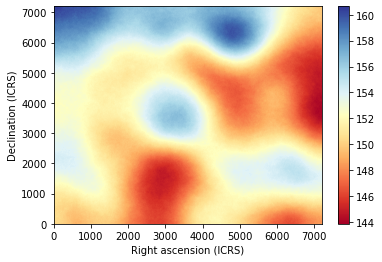

2022-08-13 13:54:41,826 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:54:41,827 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.92 [MHz] ...
2022-08-13 13:54:47,699 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:54:54,510 : simulate_frequency : INFO : Done simulate map at 189.92 [MHz].
2022-08-13 13:54:55,384 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_189.92.fits']


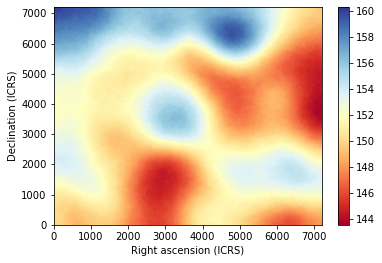

2022-08-13 13:55:00,308 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:55:00,309 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.08 [MHz] ...
2022-08-13 13:55:06,180 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:55:12,989 : simulate_frequency : INFO : Done simulate map at 190.08 [MHz].
2022-08-13 13:55:13,811 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_190.08.fits']


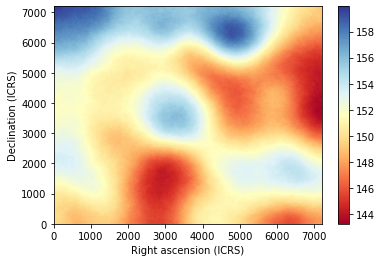

2022-08-13 13:55:18,725 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:55:18,727 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.24 [MHz] ...
2022-08-13 13:55:24,598 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:55:31,396 : simulate_frequency : INFO : Done simulate map at 190.24 [MHz].
2022-08-13 13:55:32,217 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_190.24.fits']


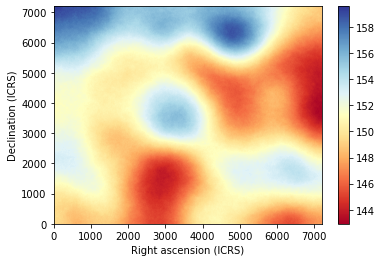

2022-08-13 13:55:37,149 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:55:37,150 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.40 [MHz] ...
2022-08-13 13:55:43,018 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:55:49,825 : simulate_frequency : INFO : Done simulate map at 190.40 [MHz].
2022-08-13 13:55:50,693 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_190.40.fits']


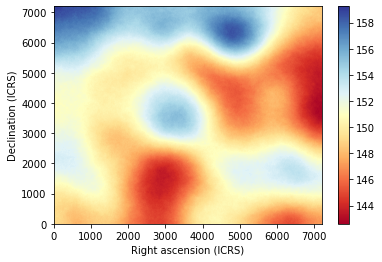

2022-08-13 13:55:55,615 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:55:55,617 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.56 [MHz] ...
2022-08-13 13:56:01,488 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:56:08,303 : simulate_frequency : INFO : Done simulate map at 190.56 [MHz].
2022-08-13 13:56:09,163 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_190.56.fits']


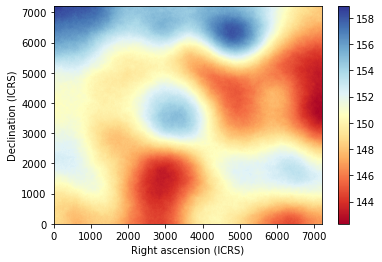

2022-08-13 13:56:14,091 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:56:14,093 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.72 [MHz] ...
2022-08-13 13:56:19,967 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:56:26,783 : simulate_frequency : INFO : Done simulate map at 190.72 [MHz].
2022-08-13 13:56:27,604 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_190.72.fits']


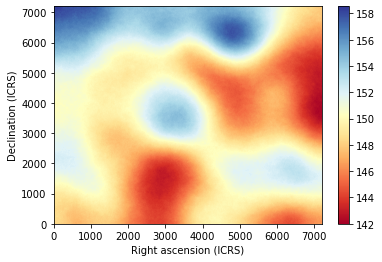

2022-08-13 13:56:32,537 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:56:32,538 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.88 [MHz] ...
2022-08-13 13:56:38,417 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:56:45,231 : simulate_frequency : INFO : Done simulate map at 190.88 [MHz].
2022-08-13 13:56:46,055 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_190.88.fits']


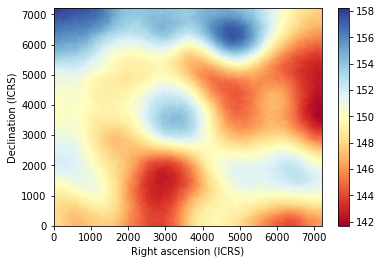

2022-08-13 13:56:51,002 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:56:51,004 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.04 [MHz] ...
2022-08-13 13:56:56,881 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:57:03,692 : simulate_frequency : INFO : Done simulate map at 191.04 [MHz].
2022-08-13 13:57:04,513 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_191.04.fits']


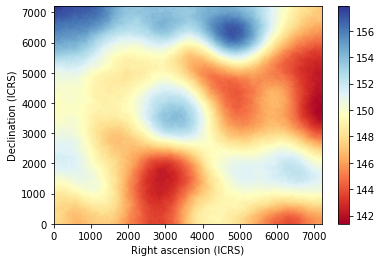

2022-08-13 13:57:06,794 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:57:06,796 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.20 [MHz] ...
2022-08-13 13:57:11,657 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:57:17,665 : simulate_frequency : INFO : Done simulate map at 191.20 [MHz].
2022-08-13 13:57:18,058 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_191.20.fits']


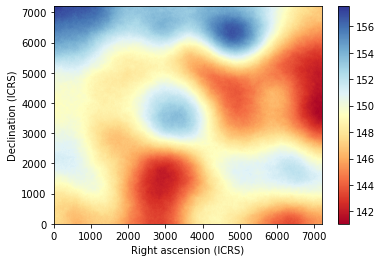

2022-08-13 13:57:19,987 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:57:19,988 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.36 [MHz] ...
2022-08-13 13:57:25,453 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:57:32,051 : simulate_frequency : INFO : Done simulate map at 191.36 [MHz].
2022-08-13 13:57:32,632 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_191.36.fits']


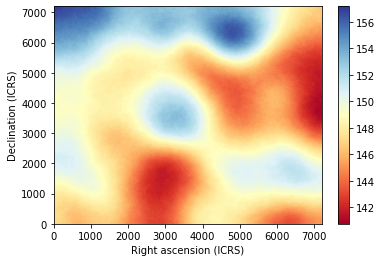

2022-08-13 13:57:36,751 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:57:36,752 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.52 [MHz] ...
2022-08-13 13:57:42,629 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:57:49,454 : simulate_frequency : INFO : Done simulate map at 191.52 [MHz].
2022-08-13 13:57:50,280 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_191.52.fits']


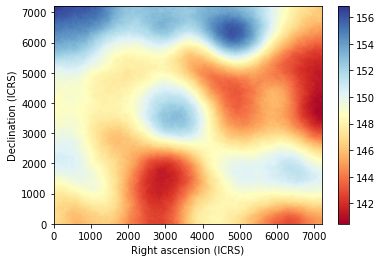

2022-08-13 13:57:55,234 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:57:55,235 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.68 [MHz] ...
2022-08-13 13:58:01,106 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:58:07,925 : simulate_frequency : INFO : Done simulate map at 191.68 [MHz].
2022-08-13 13:58:08,801 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_191.68.fits']


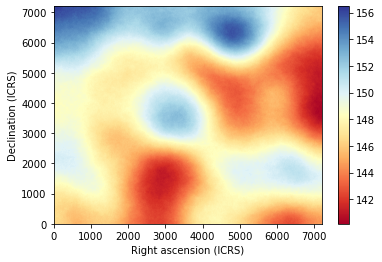

2022-08-13 13:58:13,736 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:58:13,737 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.84 [MHz] ...
2022-08-13 13:58:19,611 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:58:26,419 : simulate_frequency : INFO : Done simulate map at 191.84 [MHz].
2022-08-13 13:58:27,239 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_191.84.fits']


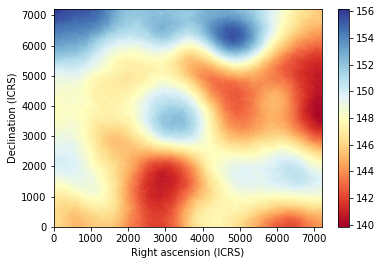

2022-08-13 13:58:32,169 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:58:32,171 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.00 [MHz] ...
2022-08-13 13:58:38,049 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:58:44,860 : simulate_frequency : INFO : Done simulate map at 192.00 [MHz].
2022-08-13 13:58:45,683 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_192.00.fits']


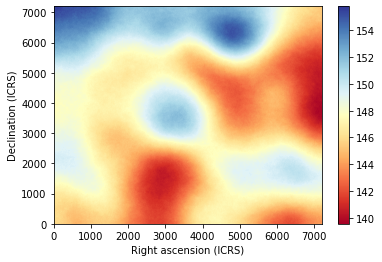

2022-08-13 13:58:50,616 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:58:50,617 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.16 [MHz] ...
2022-08-13 13:58:56,490 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:59:03,300 : simulate_frequency : INFO : Done simulate map at 192.16 [MHz].
2022-08-13 13:59:04,121 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_192.16.fits']


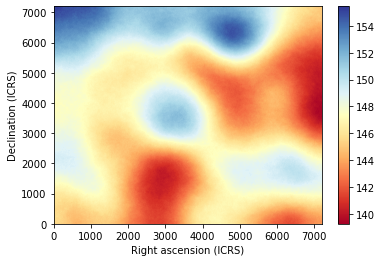

2022-08-13 13:59:09,040 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:59:09,042 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.32 [MHz] ...
2022-08-13 13:59:14,915 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:59:21,734 : simulate_frequency : INFO : Done simulate map at 192.32 [MHz].
2022-08-13 13:59:22,556 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_192.32.fits']


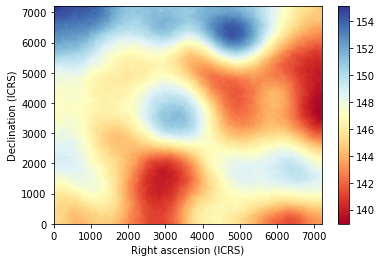

2022-08-13 13:59:27,496 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:59:27,498 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.48 [MHz] ...
2022-08-13 13:59:33,376 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:59:40,192 : simulate_frequency : INFO : Done simulate map at 192.48 [MHz].
2022-08-13 13:59:41,014 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_192.48.fits']


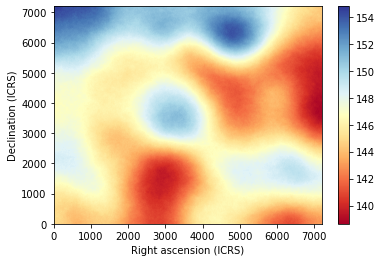

2022-08-13 13:59:45,944 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 13:59:45,945 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.64 [MHz] ...
2022-08-13 13:59:51,818 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 13:59:58,628 : simulate_frequency : INFO : Done simulate map at 192.64 [MHz].
2022-08-13 13:59:59,450 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_192.64.fits']


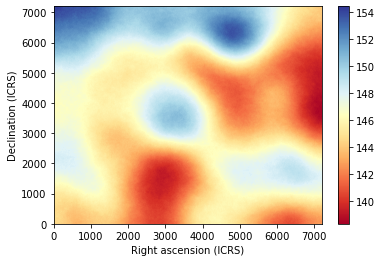

2022-08-13 14:00:04,379 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:00:04,381 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.80 [MHz] ...
2022-08-13 14:00:10,249 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:00:17,053 : simulate_frequency : INFO : Done simulate map at 192.80 [MHz].
2022-08-13 14:00:17,872 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_192.80.fits']


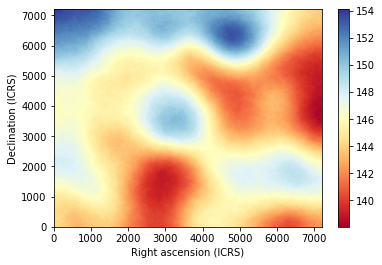

2022-08-13 14:00:20,157 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:00:20,158 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.96 [MHz] ...
2022-08-13 14:00:25,216 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:00:31,598 : simulate_frequency : INFO : Done simulate map at 192.96 [MHz].
2022-08-13 14:00:32,005 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_192.96.fits']


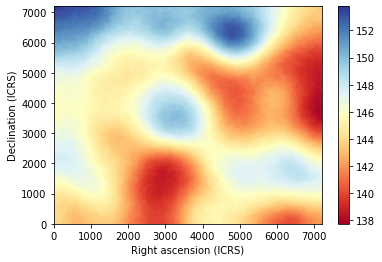

2022-08-13 14:00:36,025 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:00:36,026 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.12 [MHz] ...
2022-08-13 14:00:41,892 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:00:48,694 : simulate_frequency : INFO : Done simulate map at 193.12 [MHz].
2022-08-13 14:00:49,513 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_193.12.fits']


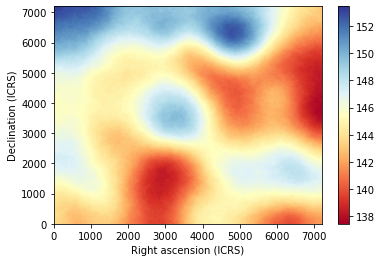

2022-08-13 14:00:54,416 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:00:54,418 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.28 [MHz] ...
2022-08-13 14:01:00,279 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:01:07,082 : simulate_frequency : INFO : Done simulate map at 193.28 [MHz].
2022-08-13 14:01:07,902 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_193.28.fits']


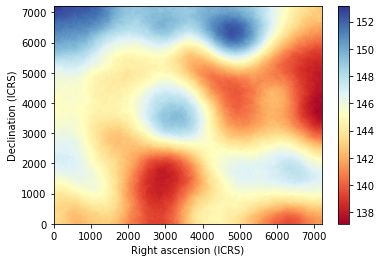

2022-08-13 14:01:12,822 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:01:12,823 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.44 [MHz] ...
2022-08-13 14:01:18,686 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:01:25,490 : simulate_frequency : INFO : Done simulate map at 193.44 [MHz].
2022-08-13 14:01:26,310 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_193.44.fits']


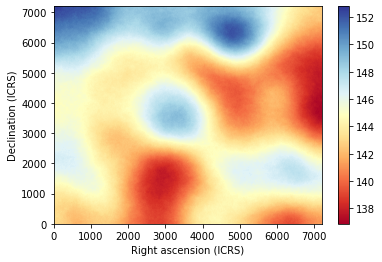

2022-08-13 14:01:31,248 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:01:31,249 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.60 [MHz] ...
2022-08-13 14:01:37,116 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:01:43,922 : simulate_frequency : INFO : Done simulate map at 193.60 [MHz].
2022-08-13 14:01:44,743 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_193.60.fits']


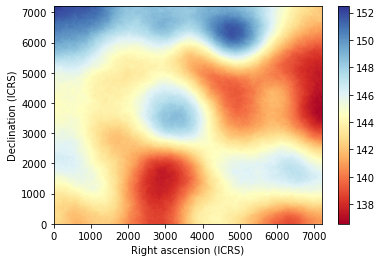

2022-08-13 14:01:49,663 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:01:49,665 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.76 [MHz] ...
2022-08-13 14:01:55,533 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:02:02,333 : simulate_frequency : INFO : Done simulate map at 193.76 [MHz].
2022-08-13 14:02:03,153 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_193.76.fits']


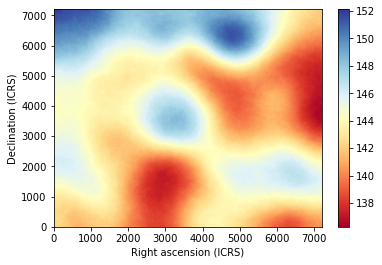

2022-08-13 14:02:08,065 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:02:08,066 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.92 [MHz] ...
2022-08-13 14:02:13,929 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:02:20,738 : simulate_frequency : INFO : Done simulate map at 193.92 [MHz].
2022-08-13 14:02:21,557 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_193.92.fits']


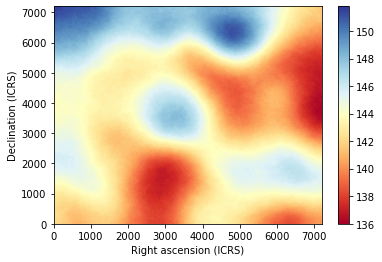

2022-08-13 14:02:26,479 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:02:26,480 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.08 [MHz] ...
2022-08-13 14:02:32,349 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:02:39,164 : simulate_frequency : INFO : Done simulate map at 194.08 [MHz].
2022-08-13 14:02:39,986 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_194.08.fits']


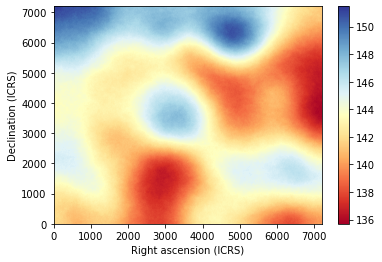

2022-08-13 14:02:44,914 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:02:44,915 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.24 [MHz] ...
2022-08-13 14:02:50,794 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:02:57,595 : simulate_frequency : INFO : Done simulate map at 194.24 [MHz].
2022-08-13 14:02:58,416 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_194.24.fits']


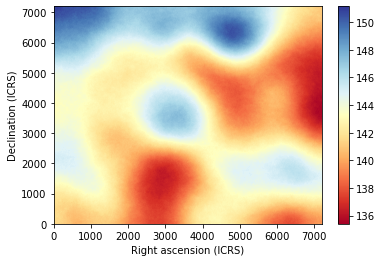

2022-08-13 14:03:03,333 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:03:03,335 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.40 [MHz] ...
2022-08-13 14:03:09,199 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:03:16,005 : simulate_frequency : INFO : Done simulate map at 194.40 [MHz].
2022-08-13 14:03:16,825 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_194.40.fits']


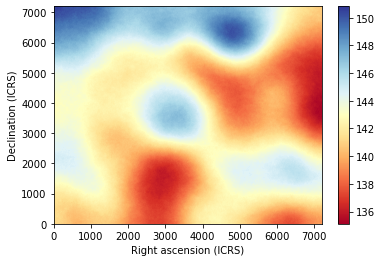

2022-08-13 14:03:21,748 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:03:21,749 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.56 [MHz] ...
2022-08-13 14:03:27,620 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:03:34,423 : simulate_frequency : INFO : Done simulate map at 194.56 [MHz].
2022-08-13 14:03:35,243 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_194.56.fits']


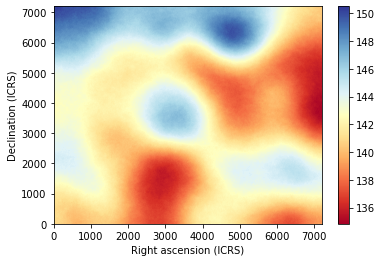

2022-08-13 14:03:37,532 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:03:37,534 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.72 [MHz] ...
2022-08-13 14:03:42,986 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:03:49,570 : simulate_frequency : INFO : Done simulate map at 194.72 [MHz].
2022-08-13 14:03:50,105 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_194.72.fits']


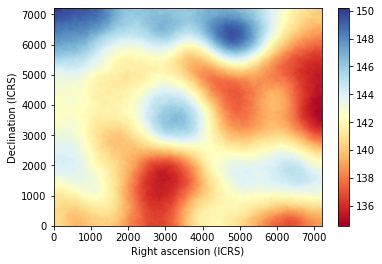

2022-08-13 14:03:54,180 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:03:54,181 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.88 [MHz] ...
2022-08-13 14:04:00,055 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:04:06,860 : simulate_frequency : INFO : Done simulate map at 194.88 [MHz].
2022-08-13 14:04:07,680 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_194.88.fits']


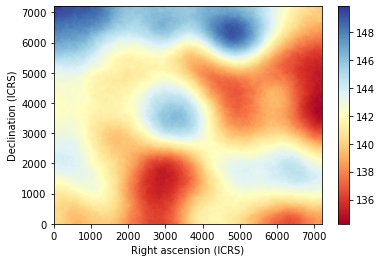

2022-08-13 14:04:12,590 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:04:12,592 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.04 [MHz] ...
2022-08-13 14:04:18,455 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:04:25,272 : simulate_frequency : INFO : Done simulate map at 195.04 [MHz].
2022-08-13 14:04:26,093 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_195.04.fits']


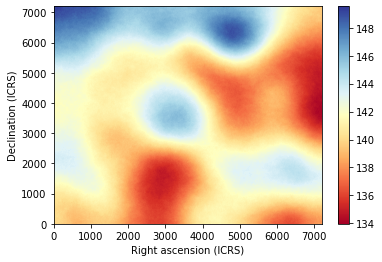

2022-08-13 14:04:31,013 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:04:31,015 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.20 [MHz] ...
2022-08-13 14:04:36,888 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:04:43,699 : simulate_frequency : INFO : Done simulate map at 195.20 [MHz].
2022-08-13 14:04:44,520 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_195.20.fits']


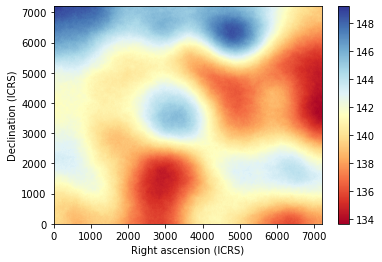

2022-08-13 14:04:49,459 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:04:49,461 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.36 [MHz] ...
2022-08-13 14:04:55,325 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:05:02,124 : simulate_frequency : INFO : Done simulate map at 195.36 [MHz].
2022-08-13 14:05:02,946 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_195.36.fits']


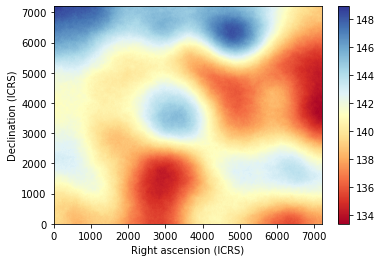

2022-08-13 14:05:07,870 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:05:07,872 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.52 [MHz] ...
2022-08-13 14:05:13,737 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:05:20,530 : simulate_frequency : INFO : Done simulate map at 195.52 [MHz].
2022-08-13 14:05:21,362 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_195.52.fits']


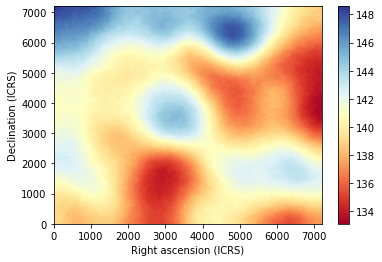

2022-08-13 14:05:26,268 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:05:26,269 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.68 [MHz] ...
2022-08-13 14:05:32,133 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:05:38,943 : simulate_frequency : INFO : Done simulate map at 195.68 [MHz].
2022-08-13 14:05:39,763 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_195.68.fits']


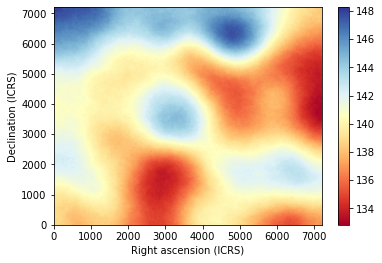

2022-08-13 14:05:44,674 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:05:44,675 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.84 [MHz] ...
2022-08-13 14:05:50,542 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:05:57,345 : simulate_frequency : INFO : Done simulate map at 195.84 [MHz].
2022-08-13 14:05:58,202 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_195.84.fits']


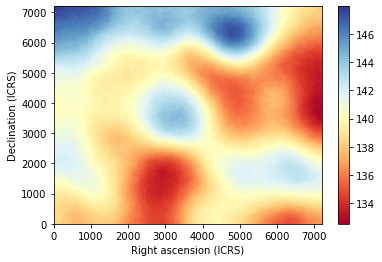

2022-08-13 14:06:03,140 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 14:06:03,141 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 196.00 [MHz] ...
2022-08-13 14:06:09,011 : add_ss : INFO : The small scale map is generated using alpha=0.04497345513923756, beta=0.22868914493756504.
2022-08-13 14:06:15,812 : simulate_frequency : INFO : Done simulate map at 196.00 [MHz].
2022-08-13 14:06:16,632 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_0-27_196.00.fits']


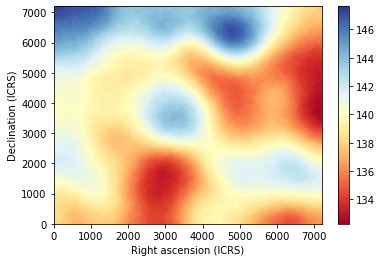

In [28]:
do_simulation(S.freqs['hig']['f'], S, s_outhig)